# <center><div style="font-family: Trebuchet MS; background-color: #FF69B4; color: #2D2926; padding: 12px; line-height: 1;">Airbnb Prices in Some of The Most Popular European Cities</div></center>

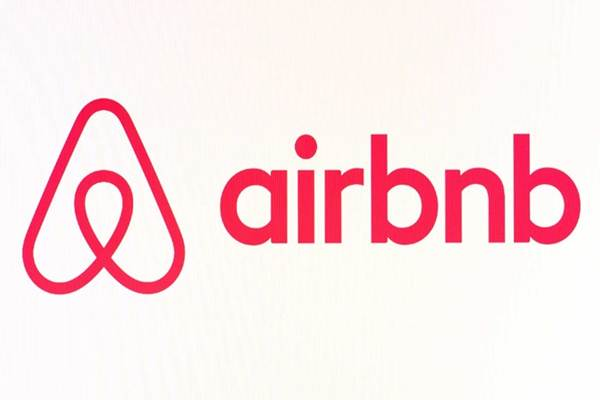

<h3 align="left">About dataset </h3>:

This dataset provides a comprehensive look at Airbnb prices in some of the most popular European cities. Each listing is evaluated for various attributes such as room types, cleanliness and satisfaction ratings, bedrooms, distance from the city centre, and more to capture an in-depth understanding of Airbnb prices on both weekdays and weekends. We hope that this data set offers insight into how global markets are affected by social dynamics and geographical factors which in turn determine pricing strategies for optimal profitability!

**Dataset Column description**:

| Column Name | Description | Data Type |
|-------------|-------------|-----------|
| realSum | The total price of the Airbnb listing | (Numeric) |
| room_type | The type of room being offered (e.g. private, shared, etc.) | (Categorical) |
| room_shared | Whether the room is shared or not | (Boolean) |
| room_private | Whether the room is private or not | (Boolean) |
| person_capacity | The maximum number of people that can stay in the room | (Numeric) |
| host_is_superhost	| Whether the host is a superhost or not | (Boolean) |
| multi | Whether the listing is for multiple rooms or not | (Boolean) |
| biz | Whether the listing is for business purposes or not | (Boolean) |
| cleanliness_rating | The cleanliness rating of the listing | (Numeric) |
| guest_satisfaction_overall | The overall guest satisfaction rating of the listing | (Numeric) |
| bedrooms | The number of bedrooms in the listing | (Numeric) |
| dist | The distance from the city centre | (Numeric) |
| metro_dist | The distance from the nearest metro station | (Numeric) |
| lng | The longitude of the listing | (Numeric) |
| lat | The latitude of the listing | (Numeric) |

Source:

https://www.kaggle.com/datasets/thedevastator/airbnb-prices-in-european-cities

## Problem Statement

 - Find insights from the dataset given
 - Use silhouette metric to compare possible clusters
 - Interprete dissimiliarities between the clustering models
 - Give label and explain the clusters

## <div style="font-family: Trebuchet MS; background-color: #d6a972; color: #2D2926; padding: 12px; line-height: 1;">IMPORT PACKAGE</div>

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from yellowbrick.cluster import KElbowVisualizer
import folium
from folium.plugins import FastMarkerCluster
import warnings
warnings.filterwarnings('ignore')

In [2]:
budapest= pd.read_csv('Budapest_airbnb.csv')
lisbon = pd.read_csv('Lisbon_airbnb.csv')
paris = pd.read_csv('Paris_airbnb.csv')

## <div style="font-family: Trebuchet MS; background-color: #d6a972; color: #2D2926; padding: 12px; line-height: 1;">DATA UNDERSTANDING</div>

In [3]:
df= pd.concat([budapest, lisbon, paris])
df = df.sample(frac=1).reset_index(drop= True)
df.head()

,Unnamed: 0,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,...,bedrooms,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,status
0,2035,312.703887,Entire home/apt,False,False,4.0,False,0,0,7.0,...,1,1.133560,0.101655,410.676631,19.969181,1097.712849,50.640053,2.35968,48.86568,Weekend
1,2007,331.344953,Entire home/apt,False,False,2.0,True,0,0,10.0,...,1,1.341330,0.207889,649.989456,31.605784,1193.492684,55.058600,2.33676,48.85071,Weekend
2,5300,336.005219,Entire home/apt,False,False,2.0,True,0,0,10.0,...,1,1.922404,0.196451,327.998804,15.948966,920.420012,42.461121,2.36253,48.87261,Weekend
3,3162,123.827392,Private room,False,True,2.0,False,1,0,9.0,...,1,2.376576,0.272993,119.882418,3.954114,349.368062,19.635409,-9.15220,38.73139,Weekend
4,615,384.146341,Entire home/apt,False,False,3.0,False,0,0,10.0,...,2,0.472055,0.384465,400.551411,13.211494,1263.480497,71.010945,-9.14500,38.71300,Weekend


In [4]:
df= df.drop('Unnamed: 0', axis= 1)
df= df.drop(['attr_index', 'attr_index_norm', 'rest_index','rest_index_norm','status'], axis= 1)

In [5]:
df.describe()

,realSum,person_capacity,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,lng,lat
count,16473.000000,16473.000000,16473.00000,16473.000000,16473.000000,16473.000000,16473.000000,16473.000000,16473.000000,16473.000000,16473.000000
mean,285.800674,3.233352,0.24695,0.390518,9.353245,92.329448,1.110059,2.361654,0.474037,2.406262,44.982560
std,247.286040,1.294556,0.43125,0.487881,0.929701,8.546871,0.691105,1.751056,0.725949,10.696042,4.623942
min,34.779339,2.000000,0.00000,0.000000,2.000000,20.000000,0.000000,0.034661,0.002301,-9.226340,38.693000
25%,162.381915,2.000000,0.00000,0.000000,9.000000,90.000000,1.000000,1.044482,0.186695,-9.133230,38.725810
50%,236.974555,3.000000,0.00000,0.000000,10.000000,94.000000,1.000000,1.940771,0.296387,2.335250,47.502920
75%,333.255159,4.000000,0.00000,1.000000,10.000000,98.000000,1.000000,3.310920,0.474408,2.405340,48.859540
max,16445.614689,6.000000,1.00000,1.000000,10.000000,100.000000,10.000000,19.250412,11.687734,19.304210,48.901060


## <div style="font-family: Trebuchet MS; background-color: #d6a972; color: #2D2926; padding: 12px; line-height: 1;">EDA</div>

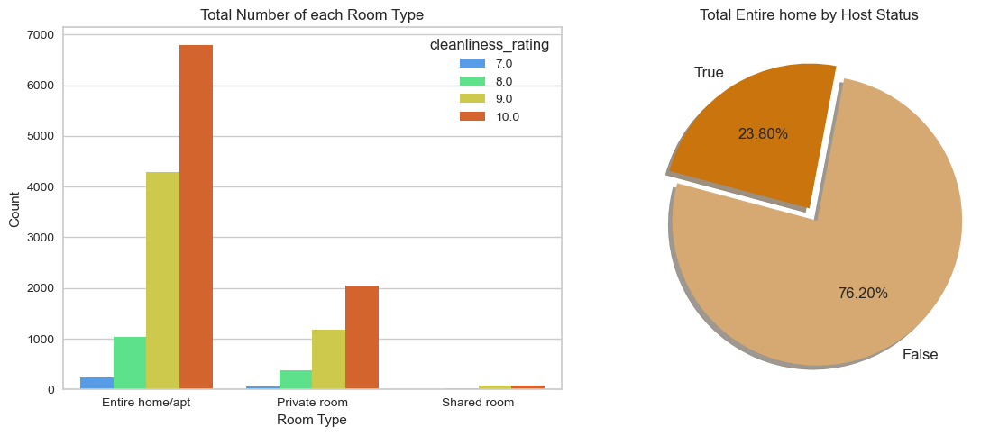

In [6]:
rat= df[df['cleanliness_rating']>=7]
entire= df[df['room_type']== 'Entire home/apt']
fig,(ax1,ax2)= plt.subplots(1,2, figsize=(12,5))

sns.countplot(x=rat['room_type'],hue=rat['cleanliness_rating'] , ax= ax1, palette= 'turbo')

entire['host_is_superhost'].value_counts().plot.pie(shadow = True, explode=[0.1, 0],
                                        autopct='%.2f%%', textprops={'fontsize':12}, 
                                        startangle=165, colors=['#d6a972', '#c9740c'], ax= ax2)

ax1.set_title('Total Number of each Room Type', fontsize=12)
ax2.set_title('Total Entire home by Host Status', fontsize=12)
ax2.axis( 'off')
ax1.set_ylabel('Count')
ax1.set_xlabel('Room Type')

plt.tight_layout()
plt.show()


insights:
>- The room type with the highest cleanliness rating is "entire home/apt."
>- Host status in entire homes/ apartments are high because to be host status, it doesn't need strict criteria as superhost and it is marketing strategy from airbnb to expand business for newbie loaners.

In [7]:
z= df.copy()
one=z[z['metro_dist']<=0.2]
one['category_dist']= '0-200 m'
two=z[(z['metro_dist']>0.2)& (z['metro_dist']<=0.5)]
two['category_dist']= '0.2-0.5km'
three=z[(z['metro_dist']>0.5)&(z['metro_dist']<=1)]
three['category_dist']= '0.5-1km'
four=z[(z['metro_dist']>1) & (z['metro_dist']<=3)]
four['category_dist']= '1-3km'
five=z[(z['metro_dist']>3) & (z['metro_dist']<=5)]
five['category_dist']= '3-5km'
six= z[(z['metro_dist']>5)& (z['metro_dist']<=7)]
six['category_dist']= '5-7km'
seven=z[(z['metro_dist']>7)&(z['metro_dist']<=9)]
seven['category_dist']= '7-9km'
eight=z[(z['metro_dist']>9) & (z['metro_dist']<=12)]
eight['category_dist']= '9-12km'

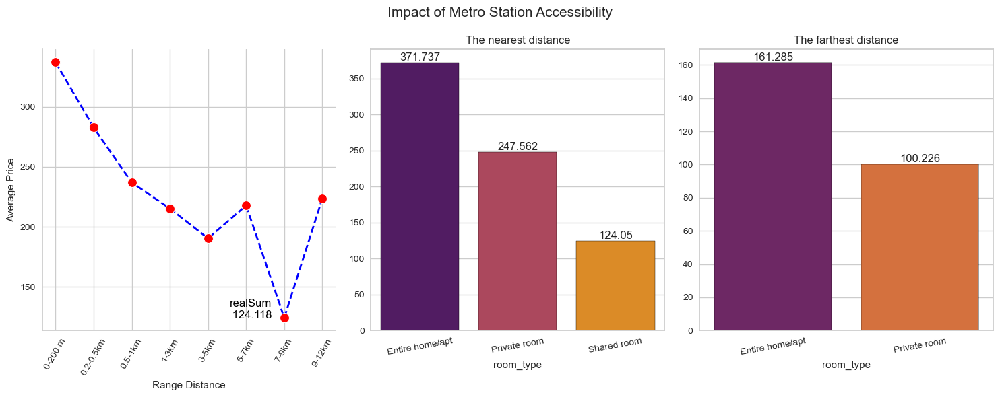

In [8]:
category= pd.concat([one,two,three,four,five, six, seven, eight])
category= pd.DataFrame(category.groupby(['category_dist'])['realSum'].mean()).reset_index()
seven1= seven.groupby(['room_type'])['realSum'].mean()
income= one.groupby('room_type')['realSum'].mean()

fig, (ax1,ax2,ax3)= plt.subplots(1,3,figsize= (15,6))
plt.suptitle('Impact of Metro Station Accessibility', fontsize= 15)
sns.lineplot(x= category['category_dist'], y= category['realSum'], ax=ax1, 
             color='blue', linewidth=2, linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
ax1.annotate(f'realSum\n 124.118', (5.8, 125), xytext=(-5, -2), textcoords='offset points', 
             color='black', ha='right')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

for tick in ax1.get_xticklabels():
    tick.set_rotation(60)

ax1.grid(True)
ax1.set_xlabel('Range Distance')
ax1.set_ylabel('Average Price')

sns.barplot(x=income.index,y= income.values, ax= ax2, palette= 'inferno', edgecolor= 'black')
ax2.bar_label(ax2.containers[0])
ax2.set_title('The nearest distance')
for tick in ax2.get_xticklabels():
    tick.set_rotation(10)

sns.barplot(x=seven1.index,y= seven1.values, ax= ax3, palette= 'inferno', edgecolor= 'black')
seven1= seven.groupby(['room_type'])['realSum'].mean()
income= one.groupby('room_type')['realSum'].mean()

sns.barplot(x=seven1.index,y= seven1.values, ax= ax3, palette= 'inferno', edgecolor= 'black')
ax3.bar_label(ax3.containers[0])
ax3.set_title('The farthest distance')
for tick in ax3.get_xticklabels():
    tick.set_rotation(10)
plt.tight_layout();

insights:
- The distance that is close to the metro station has the highest average price compared to that which is far away. This happens because of the strategy of the host, which increases the rental price, apart from the fact that metro connectivity is a necessity based on access, disturbance, noise, crime rates, and pollution (reported in the JLTU Journal: Metro Station Inauguration).
- The dominance of the high average price is filled by the entire home/apartment room type because the room types tend to be larger and the host takes advantage of rental fees that will be more profitable in that type.
- Within 7-9 km, it proves to be cheaper. Whereas in the 9–12 km range, there is one type of entire home, which has a fairly high price even though the distance is far. This happens because it could be that the building is quite large and the tenants themselves don't want to be close to the metro station or have other interests.

In [9]:
category= pd.concat([one,two,three,four,five, six, seven, eight])
dist= category.groupby('category_dist')['dist'].mean()
a= category[category['biz']== 1]
biz= a.groupby(['category_dist'])['biz'].count().reset_index()
biz

,category_dist,biz
0,0-200 m,1795
1,0.2-0.5km,3077
2,0.5-1km,1145
3,1-3km,290
4,3-5km,99
5,5-7km,25
6,7-9km,2


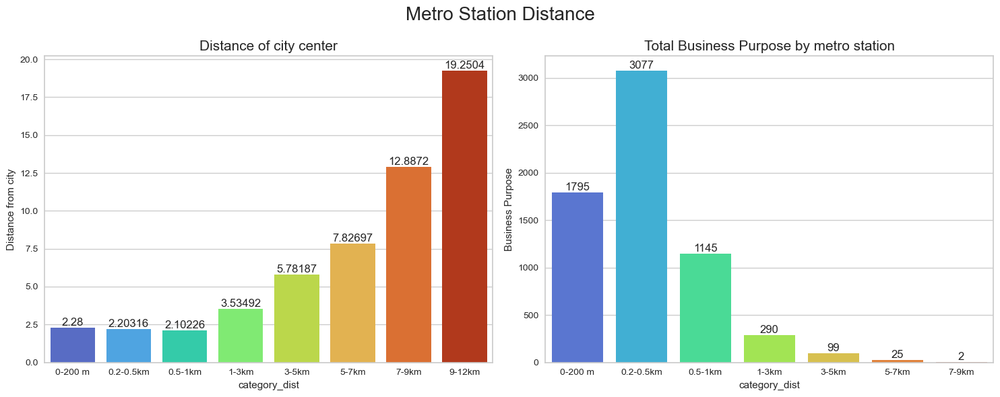

In [10]:
fig, (ax1,ax2)= plt.subplots(1,2,figsize= (15,6))
plt.suptitle('Metro Station Distance', fontsize= 20)
sns.barplot(x= dist.index, y= dist.values, palette= 'turbo', ax= ax1)

sns.barplot(x= biz['category_dist'], y= biz['biz'], palette= 'turbo', ax= ax2)
ax1.bar_label(ax1.containers[0])
ax1.set_ylabel('Distance from city')
ax2.set_ylabel('Business Purpose')
ax2.bar_label(ax2.containers[0])
ax1.set_title('Distance of city center', fontsize= 15)
ax2.set_title('Total Business Purpose by metro station', fontsize= 15)

plt.tight_layout();

Insight:
1. the farther of distance from the metro station, the distance between city centers tends to be farther too, so it can be concluded that the hosts place their buildings in strategic places.
2. Distance of 200-500 m from the metro station, total business purpose listings tend to be high, it can be concluded that accessibility to transportation greatly increases the benefits of airbnb business travel.

## <div style="font-family: Trebuchet MS; background-color: #d6a972; color: #2D2926; padding: 12px; line-height: 1;">DATA PREPROCESSING</div>

In [11]:
mapping= {True: 1, False: 0}
rt= {'Entire home/apt': 2, 'Private room': 1,'Shared room': 0}

df['room_type']= df['room_type'].map(rt)
df['room_shared']= df['room_shared'].map(mapping)
df['room_private']= df['room_private'].map(mapping)
df['host_is_superhost']= df['host_is_superhost'].map(mapping)

In [12]:
df.head()

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,lng,lat
0,312.703887,2,0,0,4.0,0,0,0,7.0,86.0,1,1.133560,0.101655,2.35968,48.86568
1,331.344953,2,0,0,2.0,1,0,0,10.0,97.0,1,1.341330,0.207889,2.33676,48.85071
2,336.005219,2,0,0,2.0,1,0,0,10.0,99.0,1,1.922404,0.196451,2.36253,48.87261
3,123.827392,1,0,1,2.0,0,1,0,9.0,90.0,1,2.376576,0.272993,-9.15220,38.73139
4,384.146341,2,0,0,3.0,0,0,0,10.0,100.0,2,0.472055,0.384465,-9.14500,38.71300


## <div style="font-family: Trebuchet MS; background-color: #d6a972; color: #2D2926; padding: 12px; line-height: 1;">STANDARDIZATION</div>

In [13]:
X= df.copy()
scaler = StandardScaler()
scale_std = scaler.fit_transform(X)
df_scl = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

## <div style="font-family: Trebuchet MS; background-color: #d6a972; color: #2D2926; padding: 12px; line-height: 1;">PCA</div>

In [14]:
from sklearn.decomposition import PCA

pca = PCA()
df_pca = pd.DataFrame(pca.fit_transform(scale_std))
pca.explained_variance_

array([2.57001779e+00, 2.09669927e+00, 1.80290457e+00, 1.51305694e+00,
       1.28530376e+00, 1.20545376e+00, 1.09156641e+00, 9.23770409e-01,
       7.71264860e-01, 5.69272277e-01, 4.13599704e-01, 3.26557396e-01,
       2.96153002e-01, 1.35290473e-01, 5.41137657e-32])

In [1]:
plt.step(list(range(1,16)), np.cumsum(pca.explained_variance_ratio_))
plt.plot(np.cumsum(pca.explained_variance_ratio_), y= 80, linestyle='--')
plt.xlabel('Eigen Values')
plt.ylabel('Ratio of Variance Explained')
plt.title('Variance Covered by each Eigen Value')
plt.show()

NameError: name 'plt' is not defined

In [16]:
df_pca2= df_pca.drop(columns= [8,9,10,11,12,13,14])

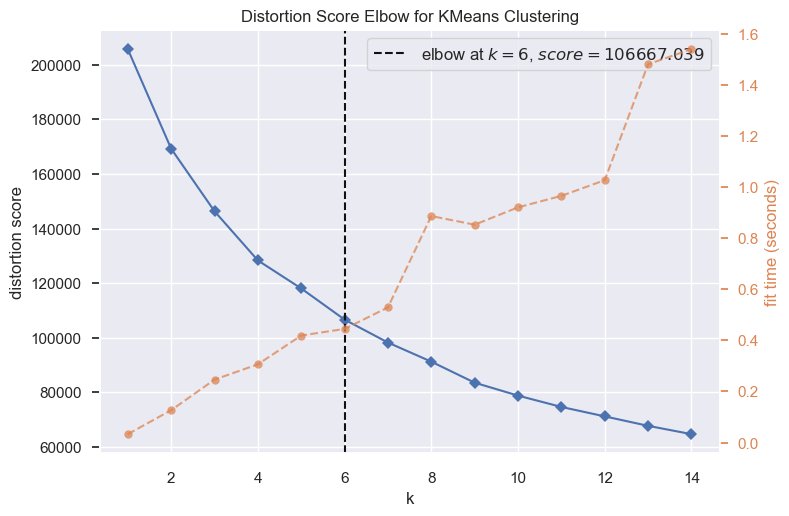

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [49]:
km = KMeans(random_state=2)
visualizer = KElbowVisualizer(km, k=(1,15))
 
visualizer.fit(df_pca2)      
visualizer.show()

## <div style="font-family: Trebuchet MS; background-color: #d6a972; color: #2D2926; padding: 12px; line-height: 1;">SILHOUETTE SCORE</div>

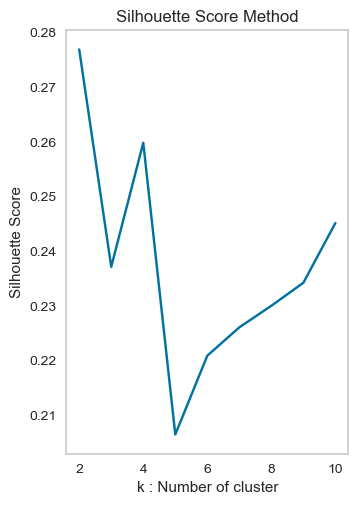

In [18]:
# Silhouette Score Method
kmax=10
sil= []
plt.subplot(1,2,2)
for k in range(2, kmax + 1):
    kmeans = KMeans(n_clusters = k).fit(df_pca2)
    labels = kmeans.labels_
    sil.append(silhouette_score(df_pca2, labels, metric = 'euclidean'))
sns.lineplot(x = range(2,kmax + 1), y = sil);
plt.title('Silhouette Score Method')
plt.xlabel("k : Number of cluster")
plt.ylabel("Silhouette Score")
plt.grid()

plt.show()

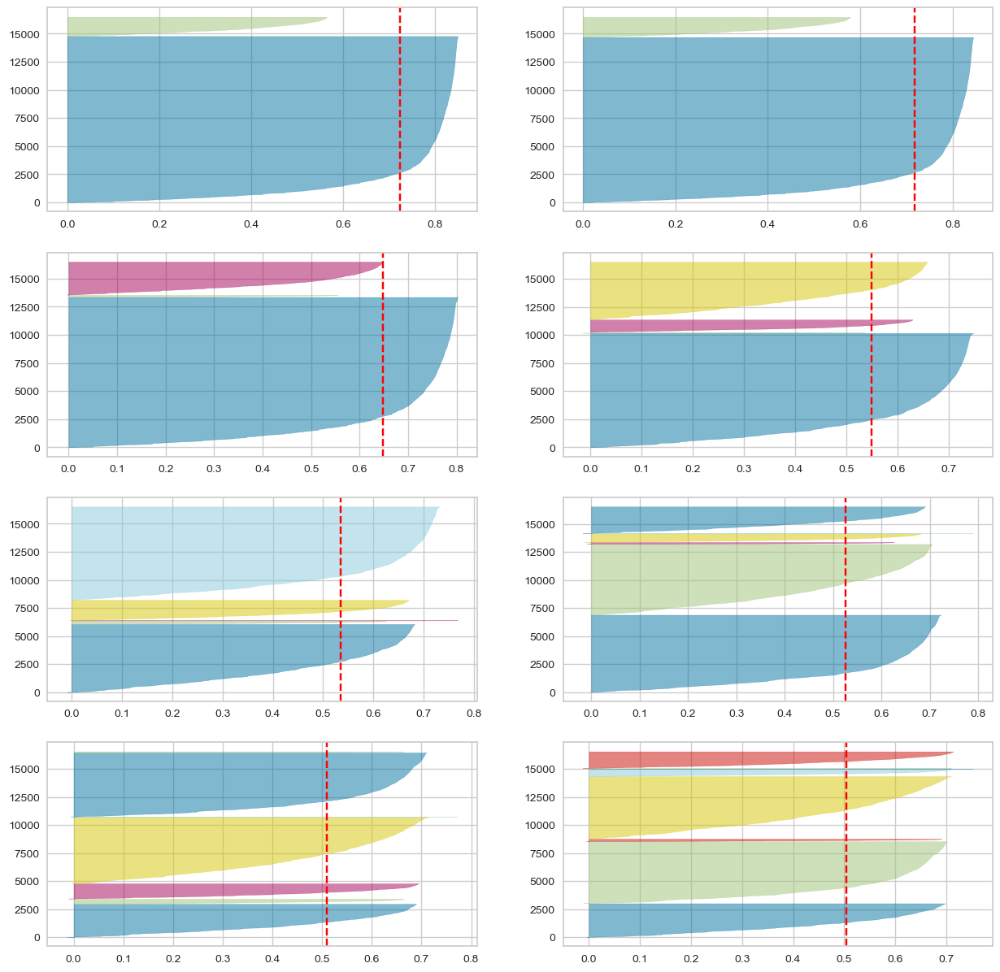

In [19]:
from yellowbrick.cluster import SilhouetteVisualizer

fig, ax = plt.subplots(4, 2, figsize=(15,15))

for i in [2, 3, 4, 5, 6]:

    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=0)
    q, mod = divmod(i, 2)

    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit() 

## <div style="font-family: Trebuchet MS; background-color: #d6a972; color: #2D2926; padding: 12px; line-height: 1;">K-MEANS ANALYSIS</div>

In [20]:
kmeans = KMeans(n_clusters=6, init='k-means++', random_state=0)
kmeans.fit(df_pca2)

KMeans(n_clusters=6, random_state=0)

In [21]:
df_airbnb_kmeans = df.copy()
df_airbnb_kmeans = pd.concat([df_airbnb_kmeans.reset_index(drop=True), df_pca2], axis=1)
df_airbnb_kmeans.columns.values[-8:] = ['component '+str(i+1) for i in range(8)]
df_airbnb_kmeans['Cluster'] = kmeans.labels_
df_airbnb_kmeans

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,...,lat,component 1,component 2,component 3,component 4,component 5,component 6,component 7,component 8,Cluster
0,312.703887,2,0,0,4.0,0,0,0,7.0,86.0,...,48.86568,0.564168,0.937359,2.411298,0.498196,0.341611,-0.675313,-0.291457,-0.089296,1
1,331.344953,2,0,0,2.0,1,0,0,10.0,97.0,...,48.85071,1.227829,-1.164721,-0.344292,-1.119765,-0.338142,-0.144166,-0.017515,0.142237,1
2,336.005219,2,0,0,2.0,1,0,0,10.0,99.0,...,48.87261,1.258047,-1.294502,-0.453479,-0.991276,-0.383059,0.030339,0.079356,0.198017,1
3,123.827392,1,0,1,2.0,0,1,0,9.0,90.0,...,38.73139,-2.876677,-0.790436,-0.734038,0.689394,0.435562,-2.038840,0.149997,0.275663,0
4,384.146341,2,0,0,3.0,0,0,0,10.0,100.0,...,38.71300,0.558890,1.253738,-1.529080,-0.471945,0.019695,-0.752041,0.562339,0.864904,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16468,195.498182,1,0,1,2.0,0,1,0,8.0,80.0,...,48.87364,-2.355906,-1.432184,1.479817,1.443408,1.074888,-1.554537,0.127439,-0.640220,0
16469,565.756361,2,0,0,4.0,0,0,0,9.0,87.0,...,48.85102,0.987966,0.238909,1.197863,1.136991,0.220418,0.540882,0.960767,0.596296,1
16470,405.443191,2,0,0,4.0,0,0,0,7.0,91.0,...,48.87111,0.934992,1.194256,1.690604,1.043251,0.919994,-0.404893,0.105750,-0.456712,4
16471,179.409006,1,0,1,2.0,0,0,1,9.0,93.0,...,38.72388,-3.138064,0.528757,-0.504110,-1.132010,0.195655,-0.103103,0.722679,-0.346745,0


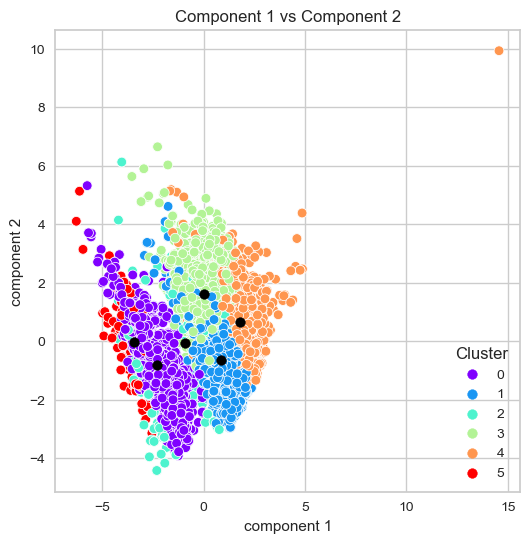

In [22]:
plt.figure(figsize=(6, 6))
sns.scatterplot(
    x=df_airbnb_kmeans['component 1'],
    y=df_airbnb_kmeans['component 2'],
    hue=df_airbnb_kmeans['Cluster'],
    palette='rainbow')

centers=np.array(kmeans.cluster_centers_)
plt.scatter(centers[:,0],centers[:,1],color='black')

plt.title('Component 1 vs Component 2')
plt.show()

In [23]:
import plotly.express as px
figrr = px.scatter_3d(df_airbnb_kmeans, x='component 1', y='component 2', z='component 3',
              color='Cluster')
figrr.show()

## <div style="font-family: Trebuchet MS; background-color: #d6a972; color: #2D2926; padding: 12px; line-height: 1;">HIERARCHICAL METHOD: AGGLOMERATIVE ANALYSIS</div>

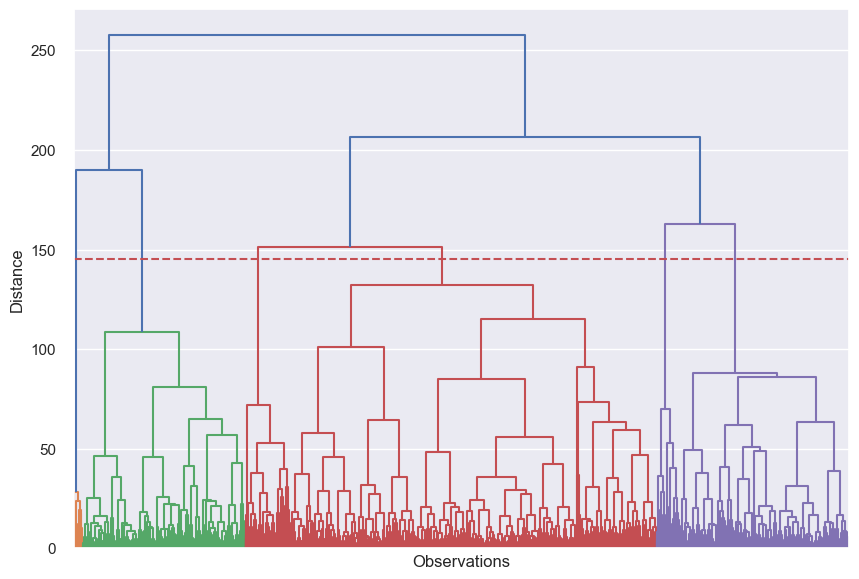

In [24]:
pca_scores = pca.transform(scale_std)
sns.set()

h_cluster = linkage(pca_scores, method='ward')

plt.figure(figsize=(10, 7))
plt.xlabel('Observations')
plt.ylabel('Distance')
dendrogram(h_cluster,
           show_leaf_counts=False,
           no_labels=True)
plt.axhline(y=145, color='r', linestyle='--')
plt.show()

In [25]:
agg = AgglomerativeClustering(n_clusters=6)
agg.fit_predict(pca_scores)

array([5, 0, 0, ..., 0, 1, 0], dtype=int64)

In [26]:
df_airbnb_hirarki = df.copy()
df_hirarki_pca = pd.concat([df_airbnb_hirarki.reset_index(drop=True), df_pca2], axis=1)
df_hirarki_pca.columns.values[-8:] = ['component '+str(i+1) for i in range(8)]
df_hirarki_pca['Hierarchical PCA'] = agg.labels_
df_hirarki_pca

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,...,lat,component 1,component 2,component 3,component 4,component 5,component 6,component 7,component 8,Hierarchical PCA
0,312.703887,2,0,0,4.0,0,0,0,7.0,86.0,...,48.86568,0.564168,0.937359,2.411298,0.498196,0.341611,-0.675313,-0.291457,-0.089296,5
1,331.344953,2,0,0,2.0,1,0,0,10.0,97.0,...,48.85071,1.227829,-1.164721,-0.344292,-1.119765,-0.338142,-0.144166,-0.017515,0.142237,0
2,336.005219,2,0,0,2.0,1,0,0,10.0,99.0,...,48.87261,1.258047,-1.294502,-0.453479,-0.991276,-0.383059,0.030339,0.079356,0.198017,0
3,123.827392,1,0,1,2.0,0,1,0,9.0,90.0,...,38.73139,-2.876677,-0.790436,-0.734038,0.689394,0.435562,-2.038840,0.149997,0.275663,1
4,384.146341,2,0,0,3.0,0,0,0,10.0,100.0,...,38.71300,0.558890,1.253738,-1.529080,-0.471945,0.019695,-0.752041,0.562339,0.864904,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16468,195.498182,1,0,1,2.0,0,1,0,8.0,80.0,...,48.87364,-2.355906,-1.432184,1.479817,1.443408,1.074888,-1.554537,0.127439,-0.640220,5
16469,565.756361,2,0,0,4.0,0,0,0,9.0,87.0,...,48.85102,0.987966,0.238909,1.197863,1.136991,0.220418,0.540882,0.960767,0.596296,0
16470,405.443191,2,0,0,4.0,0,0,0,7.0,91.0,...,48.87111,0.934992,1.194256,1.690604,1.043251,0.919994,-0.404893,0.105750,-0.456712,0
16471,179.409006,1,0,1,2.0,0,0,1,9.0,93.0,...,38.72388,-3.138064,0.528757,-0.504110,-1.132010,0.195655,-0.103103,0.722679,-0.346745,1


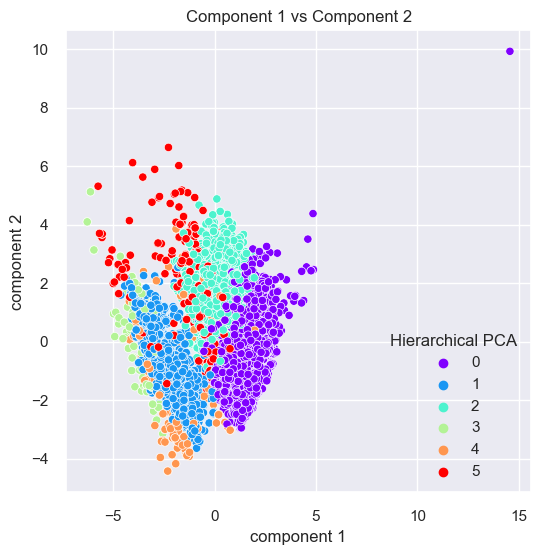

In [27]:
plt.figure(figsize=(6, 6))
sns.scatterplot(
    x=df_hirarki_pca['component 1'],
    y=df_hirarki_pca['component 2'],
    hue=df_hirarki_pca['Hierarchical PCA'],
    palette='rainbow')

plt.title('Component 1 vs Component 2')
plt.show()

In [28]:
import plotly.express as px
figrrr = px.scatter_3d(df_hirarki_pca, x='component 1', y='component 2', z='component 3',
              color='Hierarchical PCA')
figrrr.show()

## <div style="font-family: Trebuchet MS; background-color: #d6a972; color: #2D2926; padding: 12px; line-height: 1;">DBSCAN ANALYSIS</div>

In [29]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

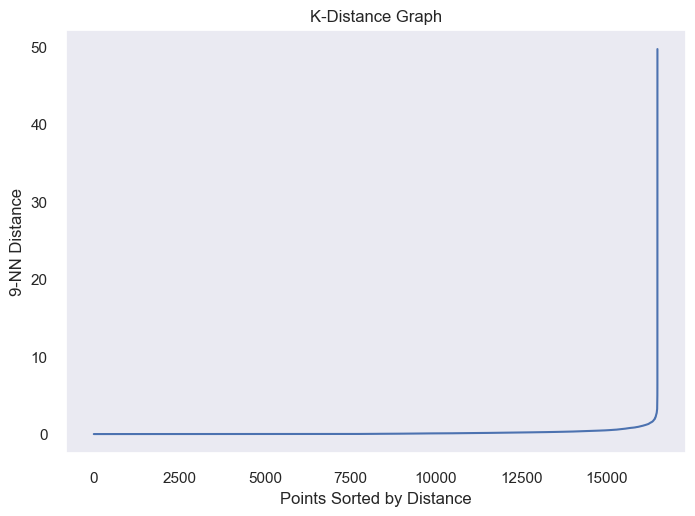

In [30]:
knn = NearestNeighbors(n_neighbors = 5)
model = knn.fit(df_scl)
distances, indices = knn.kneighbors(df_scl)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.grid()
plt.plot(distances)
plt.xlabel('Points Sorted by Distance')
plt.ylabel('9-NN Distance')
plt.title('K-Distance Graph');

In [31]:
db = DBSCAN(eps = 3, min_samples = 7).fit(df_scl)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)
print('Number of Clusters : ', n_clusters_)
print('Number of Outliers : ', n_noise_)

df_hirarki_pca['class'] = labels

Number of Clusters :  7
Number of Outliers :  119


In [32]:
df_hirarki_pca['class'].value_counts()

 0    12461
 1     3699
 3      165
-1      119
 2        9
 5        8
 6        7
 4        5
Name: class, dtype: int64

In [33]:
df_analysis = df_hirarki_pca.groupby('Hierarchical PCA', as_index=False).mean().round(3)
df_analysis

,Hierarchical PCA,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,...,lat,component 1,component 2,component 3,component 4,component 5,component 6,component 7,component 8,class
0,0,329.613,1.999,0.0,0.001,3.380,0.263,0.222,0.274,9.507,...,48.273,1.180,-0.450,0.422,-0.140,0.028,0.184,0.034,0.007,-0.003
1,1,207.386,1.000,0.0,1.000,2.263,0.187,0.319,0.489,9.410,...,43.798,-2.273,-0.834,-0.436,-0.203,0.558,-0.189,0.592,-0.531,0.997
2,2,283.330,1.997,0.0,0.003,3.850,0.229,0.235,0.552,9.517,...,38.719,0.065,1.581,-1.000,-0.212,-0.500,-0.536,-0.196,0.442,0.009
3,3,130.350,0.000,1.0,0.000,3.973,0.121,0.176,0.692,8.956,...,44.644,-3.441,-0.042,-0.031,0.238,5.320,4.048,-5.469,4.370,2.626
4,4,175.041,1.642,0.0,0.358,3.330,0.282,0.372,0.298,9.531,...,43.016,-0.805,-0.479,-1.664,3.247,-2.308,1.911,-0.690,-0.766,0.386
5,5,308.960,1.892,0.0,0.108,3.043,0.011,0.183,0.368,7.208,...,47.021,-0.593,1.054,2.818,0.967,-0.190,-0.582,-0.297,-0.232,0.066


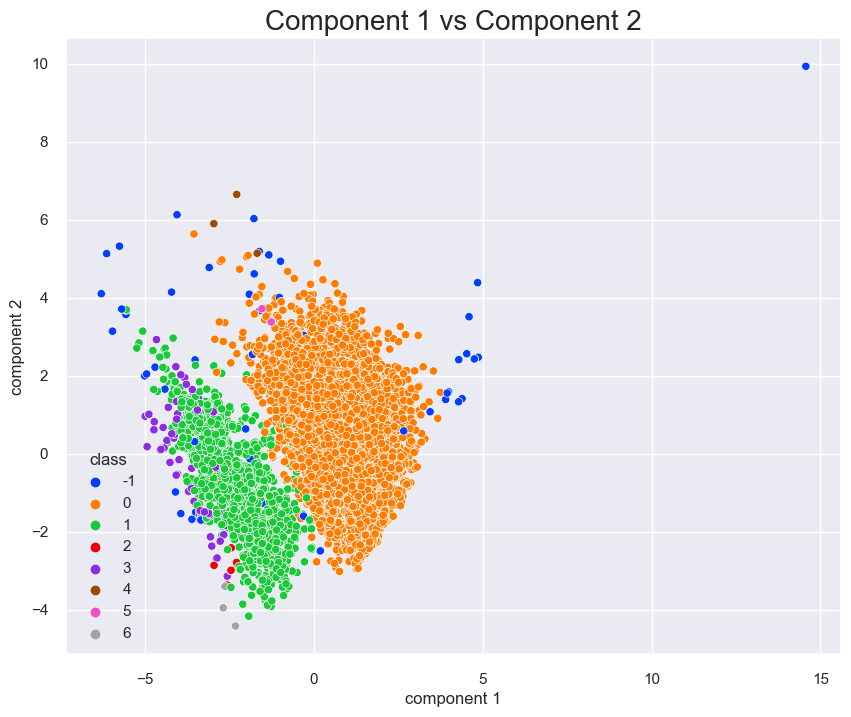

In [34]:
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x=df_hirarki_pca['component 1'],
    y=df_hirarki_pca['component 2'],
    hue=df_hirarki_pca['class'],
    palette = sns.color_palette("bright")[0:8]
)

plt.title('Component 1 vs Component 2', fontsize=20)
plt.show()

In [35]:
import plotly.express as px
fig = px.scatter_3d(df_hirarki_pca, x='component 1', y='component 2', z='component 3',
              color='class')
fig.show()

## <div style="font-family: Trebuchet MS; background-color: #d6a972; color: #2D2926; padding: 12px; line-height: 1;">SILHOUETTE SCORE MODELS</div>

In [36]:
metode_kmeans= silhouette_score(pca_scores, kmeans.labels_)
metode_hirarki=silhouette_score(pca_scores, agg.labels_)
metode_dbscan= silhouette_score(pca_scores, labels)


metode=['metode kmeans','metode hirarki', 'metode dbscan']
silhouette=[metode_kmeans,metode_hirarki,metode_dbscan]
dict = {'metode': metode, 
                'silhouette_score':silhouette} 

data_frame=pd.DataFrame(dict).sort_values(by='silhouette_score', ascending=False).reset_index().drop('index',axis=1)
data_frame['silhouette_score'] = data_frame['silhouette_score'].round(decimals = 3)
data_frame

,metode,silhouette_score
0,metode dbscan,0.215
1,metode hirarki,0.206
2,metode kmeans,0.199


[Text(0, 0, '0.215'), Text(0, 0, '0.206'), Text(0, 0, '0.199')]

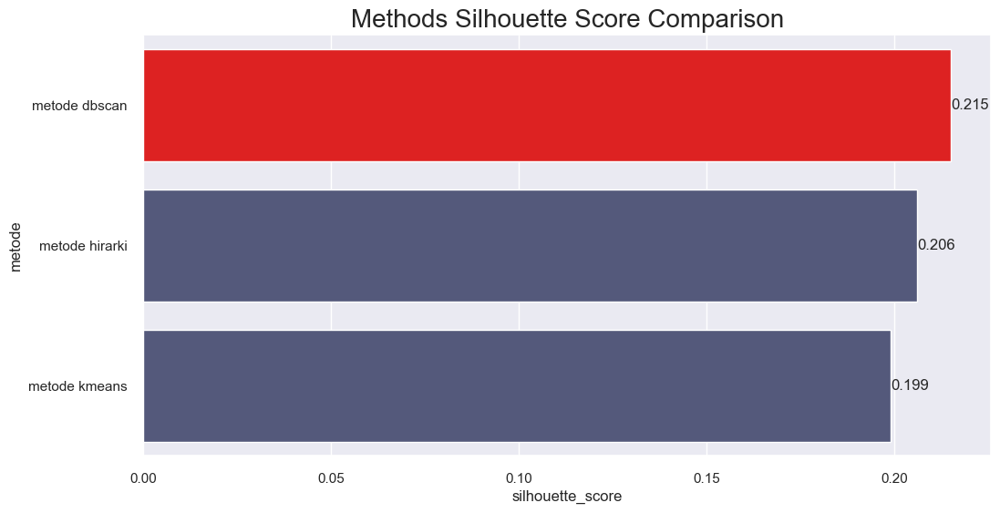

In [37]:
colors = ['#fc0303', '#4d5482', '#4d5482']
plt.figure(figsize=(12,6))
ax = sns.barplot(y='metode', x='silhouette_score',
                 data=data_frame,
                 errwidth=0,
                 orient = 'h',
                 palette = colors)               
plt.title('Methods Silhouette Score Comparison', fontsize=20)
ax.bar_label(ax.containers[0])


In [38]:
from sklearn.metrics import davies_bouldin_score
metode_kmeans= davies_bouldin_score(pca_scores, kmeans.labels_)
metode_hirarki = davies_bouldin_score(pca_scores, agg.labels_)
metode_dbscan= davies_bouldin_score(pca_scores, labels)


metode=['metode kmeans','metode hirarki', 'metode dbscan']
DBI=[metode_kmeans,metode_hirarki,metode_dbscan]
dict = {'metode': metode, 
                'DBI_score':DBI} 

data_frame=pd.DataFrame(dict).sort_values(by='DBI_score').reset_index().drop('index',axis=1)
data_frame['DBI_score'] = data_frame['DBI_score'].round(decimals = 3)
data_frame

,metode,DBI_score
0,metode hirarki,1.463
1,metode dbscan,1.465
2,metode kmeans,1.557


[Text(0, 0, '1.463'), Text(0, 0, '1.465'), Text(0, 0, '1.557')]

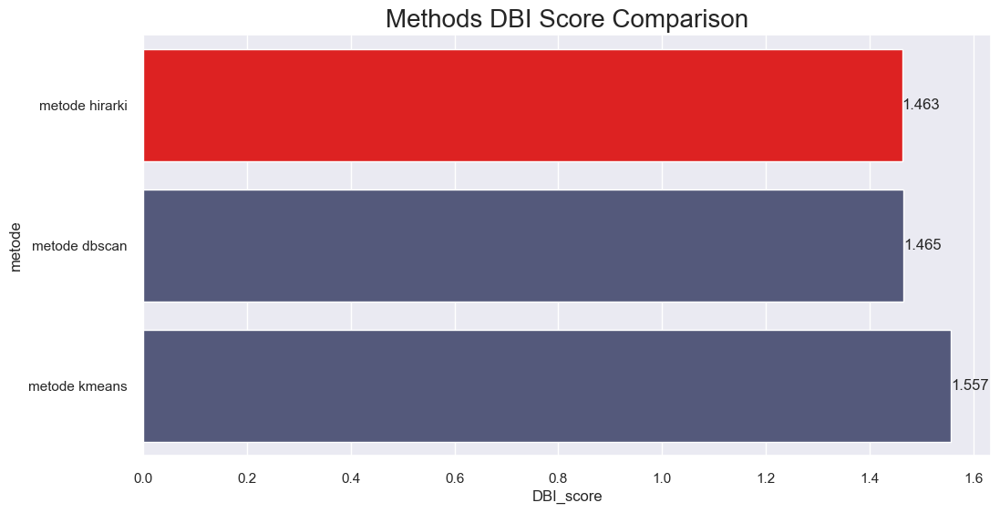

In [39]:
colors = ['#fc0303', '#4d5482', '#4d5482']
plt.figure(figsize=(12,6))
ax = sns.barplot(y='metode', x='DBI_score',
                 data=data_frame,
                 errwidth=0,
                 orient = 'h',
                 palette = colors)

plt.title('Methods DBI Score Comparison', fontsize=20)
ax.bar_label(ax.containers[0])


In [40]:
lat = list(df['lat'])
long = list(df['lng'])
location_c = list(zip(lat, long))
map = folium.Map(location=[30, 10], zoom_start=3)
FastMarkerCluster(data=location_c).add_to(map)
map

In [41]:
df2=df.copy()
df2['Hierarchical PCA'] = agg.labels_
df2

group=df2.groupby('Hierarchical PCA').mean()
group.style.highlight_max(color = 'yellow', axis = 0)

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,lng,lat
Hierarchical PCA,,,,,,,,,,,,,,,
0,329.613275,1.999488,0.000000,0.000512,3.380105,0.263091,0.222123,0.274229,9.507361,94.567149,1.038663,2.307704,0.292639,9.518990,48.272812
1,207.385896,1.000000,0.000000,1.000000,2.262991,0.187356,0.318707,0.489030,9.409642,92.192263,1.027136,2.598531,0.350403,-1.734817,43.798300
2,283.330055,1.997211,0.000000,0.002789,3.849693,0.229225,0.234523,0.552147,9.516732,92.570831,1.390686,1.589040,0.592886,-9.141628,38.719092
3,130.350182,0.000000,1.000000,0.000000,3.972527,0.120879,0.175824,0.692308,8.956044,89.703297,1.000000,3.034706,0.349873,-1.029991,44.644325
4,175.040862,1.641851,0.000000,0.358149,3.329980,0.281690,0.372233,0.297787,9.531187,93.607646,1.307847,6.422608,3.683831,4.426234,43.015950
5,308.960184,1.891747,0.000000,0.108253,3.042872,0.010718,0.183280,0.367631,7.207931,73.008574,0.853162,2.608880,0.309308,2.212677,47.021007


In [42]:
group = group.drop(['lng', 'lat'], axis=1)
group_std = pd.DataFrame(scaler.fit_transform(group), columns=group.columns)
group_std

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist
0,1.239893,0.799494,-0.447214,-0.677953,0.130941,0.870628,-0.405811,-1.157496,0.581771,0.712593,-0.345383,-0.506451,-0.515662
1,-0.434683,-0.583552,-0.447214,2.094140,-1.852641,0.055896,0.946095,0.294001,0.464766,0.392815,-0.407346,-0.319030,-0.468914
2,0.605790,0.796344,-0.447214,-0.671639,0.964757,0.506311,-0.232239,0.720509,0.592991,0.443789,1.546883,-0.969589,-0.272677
3,-1.490111,-1.967306,2.236068,-0.679373,1.182865,-0.659238,-1.053860,1.667629,-0.078354,0.057676,-0.553214,-0.037940,-0.469343
4,-0.877826,0.304613,-0.447214,0.313957,0.041938,1.070717,1.695319,-0.998305,0.610299,0.583396,1.101590,2.145371,2.228767
5,0.956936,0.650407,-0.447214,-0.379132,-0.467859,-1.844316,-0.949503,-0.526338,-2.171473,-2.190269,-1.342530,-0.312360,-0.502171


In [43]:
group_std.rename(index = {
    0: 'Airbnb Luxe',
    1: 'Airbnb Private Rooms',
    2: 'Airbnb for Plus',
    3: 'Airbnb for Work',
    4: 'Airbnb Guest Ready',
    5: 'Airbnb Basic/Clasic'
}, inplace=True)
group_std.index.name = 'cluster'
group_std.reset_index()
group_std

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist
cluster,,,,,,,,,,,,,
Airbnb Luxe,1.239893,0.799494,-0.447214,-0.677953,0.130941,0.870628,-0.405811,-1.157496,0.581771,0.712593,-0.345383,-0.506451,-0.515662
Airbnb Private Rooms,-0.434683,-0.583552,-0.447214,2.094140,-1.852641,0.055896,0.946095,0.294001,0.464766,0.392815,-0.407346,-0.319030,-0.468914
Airbnb for Plus,0.605790,0.796344,-0.447214,-0.671639,0.964757,0.506311,-0.232239,0.720509,0.592991,0.443789,1.546883,-0.969589,-0.272677
Airbnb for Work,-1.490111,-1.967306,2.236068,-0.679373,1.182865,-0.659238,-1.053860,1.667629,-0.078354,0.057676,-0.553214,-0.037940,-0.469343
Airbnb Guest Ready,-0.877826,0.304613,-0.447214,0.313957,0.041938,1.070717,1.695319,-0.998305,0.610299,0.583396,1.101590,2.145371,2.228767
Airbnb Basic/Clasic,0.956936,0.650407,-0.447214,-0.379132,-0.467859,-1.844316,-0.949503,-0.526338,-2.171473,-2.190269,-1.342530,-0.312360,-0.502171


In [44]:
group_std = group_std.reset_index()

In [45]:
a = group_std.T
a

,0,1,2,3,4,5
cluster,Airbnb Luxe,Airbnb Private Rooms,Airbnb for Plus,Airbnb for Work,Airbnb Guest Ready,Airbnb Basic/Clasic
realSum,1.239893,-0.434683,0.60579,-1.490111,-0.877826,0.956936
room_type,0.799494,-0.583552,0.796344,-1.967306,0.304613,0.650407
room_shared,-0.447214,-0.447214,-0.447214,2.236068,-0.447214,-0.447214
room_private,-0.677953,2.09414,-0.671639,-0.679373,0.313957,-0.379132
person_capacity,0.130941,-1.852641,0.964757,1.182865,0.041938,-0.467859
host_is_superhost,0.870628,0.055896,0.506311,-0.659238,1.070717,-1.844316
multi,-0.405811,0.946095,-0.232239,-1.05386,1.695319,-0.949503
biz,-1.157496,0.294001,0.720509,1.667629,-0.998305,-0.526338
cleanliness_rating,0.581771,0.464766,0.592991,-0.078354,0.610299,-2.171473


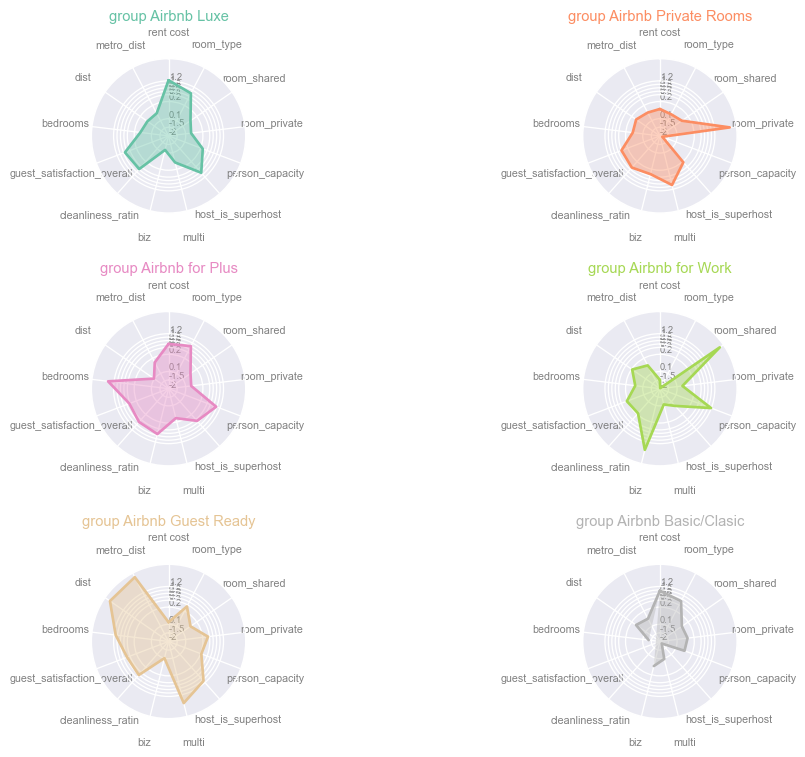

In [46]:
# Libraries
import matplotlib.pyplot as plt
import pandas as pd
from math import pi
 
# Set data
df9 = pd.DataFrame({
'group': ['Airbnb Luxe', 'Airbnb Private Rooms', 'Airbnb for Plus', 'Airbnb for Work', 'Airbnb Guest Ready', 'Airbnb Basic/Clasic'],
'rent cost' :[1.23989, -0.434683, 0.60579, -1.490111, -0.877826, 0.956936],
'room_type' :[0.799494,-0.583552,0.796344,-1.967306,0.304613,0.650407],
'room_shared':[-0.447214,-0.447214,-0.447214,2.236068,-0.447214,-0.447214],
'room_private' :[-0.677953,2.09414,-0.671639,-0.679373,0.313957,-0.379132],
'person_capacity' :[0.130941,-1.852641,0.964757,1.182865,0.041938,-0.467859],
'host_is_superhost' :[0.870628,0.055896,0.506311,-0.659238,1.070717,-1.844316],
'multi': [-0.405811,0.946095,-0.232239,-1.05386,1.695319,-0.949503],
'biz':[-1.157496,0.294001,0.720509,1.667629,-0.998305,-0.526338],
'cleanliness_ratin':[0.581771,0.464766,0.59299,-0.078354,0.610299,-2.171473],
'guest_satisfaction_overall':[0.712593,0.392815,0.443789,0.057676,0.583396,-2.190269],
'bedrooms':[-0.345383,-0.407346,1.546883,-0.553214,1.10159,-1.34253],
'dist':[-0.506451,-0.31903,-0.969589,-0.03794,2.145371,-0.31236],
'metro_dist' :[-0.515662,-0.468914,-0.272677,-0.469343,2.228767,-0.502171]
})
 
# ------- PART 1: Define a function that do a plot for one line of the dataset!
 
def make_spider( row, title, color):

    # number of variable
    categories=list(df9)[1:]
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(4,2,row+1, polar=True, )

    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='grey', size=8)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([-2, -1.5, -1, 0 , 0.4, 0.6, 0.8, 1, 1.2, 2.6], ['-2', '-1.5', '0.1', '0.2', '0.4', '0.6', '0.8', '1', '1.2', '1.4'], color="grey", size=7)
    plt.ylim(-2, 2.5)

    # Ind1
    values=df9.loc[row].drop('group').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    # Add a title
    plt.title(title, size=11, color=color, y=1.2)

    
# ------- PART 2: Apply the function to all individuals
# initialize the figure
my_dpi=96
plt.figure(figsize=(1000/my_dpi, 1000/my_dpi), dpi=my_dpi)
 
# Create a color palette:
my_palette = plt.cm.get_cmap("Set2", len(df9.index))
 
# Loop to plot
for row in range(0, len(df9.index)):
    make_spider( row=row, title='group '+df9['group'][row], color=my_palette(row))
    
plt.tight_layout()

# Intrerpretation:

>- Cluster 0 (Airbnb Luxe) is filled with the high price and guest satisfaction, high cleanliness rating, Entire home/apt type, superhost domination, near from metro station(far of crowded), low business propose (for trip planner). Airbnb luxury is one of luxury program of Airbnb

>- Cluster 1 (Airbnb private rooms) is dominantly placed with room private. especially to guest which need healing as well.

>- Cluster 2( Airbnb for Plus) near from city center, possible for business propose, good cleanliness rating. airplus is program that offers a curated selection of high quality and cleanliness standards

>- Cluster 3 (Airbnb for Work) is filled by room shared dan cheapest price, person capacity 4, business travel domination.

>- Cluster 4 (Airbnb Guest Ready ) has highest cleanliness rating, but far from city center and metro station.
it usually used for photography activity. 

>- Cluster 5 (Airbnb Basic/Clasic) has lowest cleanliness rating dan guest satisfaction overall, host newbie domination, Easy Accessbility for metro station but far enough from center city.



## <div style="font-family: Trebuchet MS; background-color: #d6a972; color: #2D2926; padding: 12px; line-height: 1;">CONCLUSION</div>

1. In this airbnb dataset, we got the highest silhouette score of **0.215** from the DBSCAN method, with a **k value of 6**.
2. The results of the interpretation of the cluster categories are **Airbnb luxe, private rooms, for plus, for work, GuestReady, and Basic/Clasic**.